In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.comdocker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
import cv2
import seaborn as sns
import glob
import xml.etree.ElementTree as ET
from PIL import Image
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
'''
for dirname, _, filenames in os.walk('input'):
    for filename in filenames:
        #print(os.path.join(dirname, filename))
'''
# You can write up to 20GB to the current directory (working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to temp/, but they won't be saved outside of the current session

2023-12-15 16:11:14.057515: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-12-15 16:11:14.074400: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-15 16:11:14.074415: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-15 16:11:14.074953: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-15 16:11:14.078231: I tensorflow/core/platform/cpu_feature_guar

"\nfor dirname, _, filenames in os.walk('input'):\n    for filename in filenames:\n        #print(os.path.join(dirname, filename))\n"

In [4]:
test_dir_img = 'cub_200_2011_xml/valid_images'
test_dir_label='cub_200_2011_xml/valid_labels'
train_dir_img = 'cub_200_2011_xml/train_images'
train_dir_label='cub_200_2011_xml/train_labels'

output_dir = '/home/r11011101/Desktop/cv_homework/object detect/myYolo/working'

In [5]:
os.makedirs('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/train', exist_ok=True)

In [6]:
import shutil

#Set the original folder path and the working folder path
label_dir = "/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/train/label"
image_dir = "/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/train/image"


os.makedirs(label_dir, exist_ok=True)
os.makedirs(image_dir, exist_ok=True)


#Copy XML files from the original folder to the XML folder to be created.
for file in os.listdir(train_dir_label):
    if file.endswith(".xml"):
        shutil.copy(os.path.join(train_dir_label, file), label_dir)

# Copy JPG files from the original folder to the JPG folder to be created."
# "Convert them to 'RGB'
for filename in os.listdir(train_dir_img):
    if filename.endswith(".jpg"):
        image = Image.open(os.path.join(train_dir_img, filename))
        image = image.convert("RGB")
        new_filename = os.path.splitext(filename)[0] + ".jpeg"
        image.save(os.path.join(image_dir, new_filename), "JPEG")

In [7]:
for i in glob.glob(train_dir_label+'/*.xml'):
    print(i.split('/')[-1][0:-4])
    break

Least_Auklet_0045_795069


In [8]:
df = {'name': [],
      'label': [],
      'width': [],
      'height': [],
     'xmin': [],
     'ymin': [],
     'xmax': [],
     'ymax': []}

for idx, anno in enumerate(glob.glob(label_dir + '/*.xml')):
    trees = ET.parse(anno)
    
    #print(anno)
    root = trees.getroot()
    width, height = [], []
    for item in root.iter():
        #print(item)
               
        if item.tag == 'size':
            for attr in list(item):
                if attr.tag == 'width':
                    width = int(round(float(attr.text)))
                if attr.tag == 'height':
                    height = int(round(float(attr.text)))
                    
        if item.tag == 'object':
            for attr in list(item):
                if 'name' in attr.tag:
                    label = attr.text
                    df['label'] += [label]
                    df['width'] += [width]
                    df['height'] += [height]
                    #dataset['name']+=[anno.split('/')[-1][0:-4]] 
                    df['name'] += [anno.split('/')[-1][0:-4]]
                    
                if 'bndbox' in attr.tag:
                    for dim in attr:
                        if dim.tag == 'xmin':
                            xmin = int(round(float(dim.text)))
                            df['xmin'] += [xmin]
                            
                        if dim.tag == 'ymin':
                            ymin = int(round(float(dim.text)))
                            df['ymin'] += [ymin]
                        if dim.tag == 'xmax':
                            xmax = int(round(float(dim.text)))
                            df['xmax'] += [xmax]
                        if dim.tag == 'ymax':
                            ymax = int(round(float(dim.text)))
                            df['ymax'] += [ymax]

In [9]:
df1 = pd.DataFrame(df)
df1.head()
df1.describe()

,width,height,xmin,ymin,xmax,ymax
count,5993.000000,5993.000000,5993.000000,5993.000000,5993.000000,5993.000000
mean,467.646921,386.277991,103.458034,83.167362,361.322543,316.280828
std,64.493382,70.942514,63.830814,43.067594,76.322778,72.289036
min,121.000000,120.000000,0.000000,0.000000,118.000000,114.000000
25%,492.000000,333.000000,51.000000,52.000000,307.000000,266.000000
50%,500.000000,375.000000,98.000000,80.000000,362.000000,307.000000
75%,500.000000,435.000000,148.000000,110.000000,422.000000,357.000000
max,500.000000,500.000000,317.000000,295.000000,501.000000,499.000000


In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5993 entries, 0 to 5992
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   name    5993 non-null   object
 1   label   5993 non-null   object
 2   width   5993 non-null   int64 
 3   height  5993 non-null   int64 
 4   xmin    5993 non-null   int64 
 5   ymin    5993 non-null   int64 
 6   xmax    5993 non-null   int64 
 7   ymax    5993 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 374.7+ KB


In [11]:
len(df1['label'].unique())
df1['label'].unique()

array(['Least Auklet', 'Horned Puffin', 'Cape Glossy Starling',
       'American Pipit', 'Gray Kingbird', 'Pigeon Guillemot',
       'Eared Grebe', 'Cerulean Warbler', 'American Redstart',
       'Shiny Cowbird', 'Heermann Gull', 'Herring Gull',
       'American Goldfinch', 'Nighthawk', 'Evening Grosbeak', 'Green Jay',
       'Red Winged Blackbird', 'Henslow Sparrow', 'Cactus Wren',
       'Caspian Tern', 'Parakeet Auklet', 'Brandt Cormorant',
       'Yellow Warbler', 'Groove Billed Ani',
       'Black Throated Blue Warbler', 'Tree Sparrow', 'Western Grebe',
       'Bobolink', 'Clark Nutcracker', 'White Throated Sparrow',
       'Brewer Blackbird', 'California Gull', 'Least Flycatcher',
       'Dark Eyed Junco', 'Gray Catbird', 'Bohemian Waxwing',
       'Ivory Gull', 'Indigo Bunting', 'Pileated Woodpecker',
       'Whip Poor Will', 'Western Wood Pewee', 'Rock Wren',
       'Rusty Blackbird', 'House Sparrow', 'Forsters Tern',
       'Prairie Warbler', 'Tree Swallow', 'Green Violetear',

In [12]:
df1.head()

,name,label,width,height,xmin,ymin,xmax,ymax
0,Least_Auklet_0045_795069,Least Auklet,326,500,28,133,195,411
1,Horned_Puffin_0067_100737,Horned Puffin,457,500,164,140,291,331
2,Cape_Glossy_Starling_0065_129299,Cape Glossy Starling,500,310,15,49,367,307
3,American_Pipit_0024_99813,American Pipit,500,307,60,79,297,223
4,Gray_Kingbird_0037_70050,Gray Kingbird,375,500,59,142,227,453


In [11]:
'''
import pandas as pd

# 假設 df 是你的 DataFrame
data = {'name': ['American_Redstart_0067_103259', 'Great_Crested_Flycatcher_0089_29592', 'Chipping_Sparrow_0032_108882',
                 'Green_Kingfisher_0099_70942', 'Cape_Glossy_Starling_0080_129362'],
        'label': ['American Redstart', 'Great Crested Flycatcher', 'Chipping Sparrow', 'Green Kingfisher',
                  'Cape Glossy Starling'],
        'width': [500, 500, 500, 333, 345],
        'height': [333, 375, 467, 500, 500],
        'xmin': [98, 115, 0, 60, 49],
        'ymin': [95, 100, 52, 126, 81],
        'xmax': [490, 308, 441, 299, 209],
        'ymax': [262, 345, 465, 382, 480]}

df = pd.DataFrame(data)

print(df)

# 提取 class
df['class'] = df['name'].str.extract(r'_(\d{4})_')

# 將 'class' 欄位轉換為整數
df['class'] = df['class'].astype(int)

# 打印結果
print(df[['name', 'class']])
'''

"\nimport pandas as pd\n\n# 假設 df 是你的 DataFrame\ndata = {'name': ['American_Redstart_0067_103259', 'Great_Crested_Flycatcher_0089_29592', 'Chipping_Sparrow_0032_108882',\n                 'Green_Kingfisher_0099_70942', 'Cape_Glossy_Starling_0080_129362'],\n        'label': ['American Redstart', 'Great Crested Flycatcher', 'Chipping Sparrow', 'Green Kingfisher',\n                  'Cape Glossy Starling'],\n        'width': [500, 500, 500, 333, 345],\n        'height': [333, 375, 467, 500, 500],\n        'xmin': [98, 115, 0, 60, 49],\n        'ymin': [95, 100, 52, 126, 81],\n        'xmax': [490, 308, 441, 299, 209],\n        'ymax': [262, 345, 465, 382, 480]}\n\ndf = pd.DataFrame(data)\n\nprint(df)\n\n# 提取 class\ndf['class'] = df['name'].str.extract(r'_(\\d{4})_')\n\n# 將 'class' 欄位轉換為整數\ndf['class'] = df['class'].astype(int)\n\n# 打印結果\nprint(df[['name', 'class']])\n"

In [22]:
# 提供的資料
bird_data = ['Least Auklet', 'Horned Puffin', 'Cape Glossy Starling',
       'American Pipit', 'Gray Kingbird', 'Pigeon Guillemot',
       'Eared Grebe', 'Cerulean Warbler', 'American Redstart',
       'Shiny Cowbird', 'Heermann Gull', 'Herring Gull',
       'American Goldfinch', 'Nighthawk', 'Evening Grosbeak', 'Green Jay',
       'Red Winged Blackbird', 'Henslow Sparrow', 'Cactus Wren',
       'Caspian Tern', 'Parakeet Auklet', 'Brandt Cormorant',
       'Yellow Warbler', 'Groove Billed Ani',
       'Black Throated Blue Warbler', 'Tree Sparrow', 'Western Grebe',
       'Bobolink', 'Clark Nutcracker', 'White Throated Sparrow',
       'Brewer Blackbird', 'California Gull', 'Least Flycatcher',
       'Dark Eyed Junco', 'Gray Catbird', 'Bohemian Waxwing',
       'Ivory Gull', 'Indigo Bunting', 'Pileated Woodpecker',
       'Whip Poor Will', 'Western Wood Pewee', 'Rock Wren',
       'Rusty Blackbird', 'House Sparrow', 'Forsters Tern',
       'Prairie Warbler', 'Tree Swallow', 'Green Violetear',
       'Chuck Will Widow', 'Harris Sparrow', 'Red Bellied Woodpecker',
       'Scott Oriole', 'Cape May Warbler', 'Blue Headed Vireo',
       'Downy Woodpecker', 'Olive Sided Flycatcher', 'Rufous Hummingbird',
       'Western Gull', 'Cedar Waxwing', 'Brown Creeper',
       'White Eyed Vireo', 'Seaside Sparrow', 'Tropical Kingbird',
       'Green Tailed Towhee', 'Fox Sparrow', 'Brewer Sparrow',
       'Pacific Loon', 'Green Kingfisher', 'Great Crested Flycatcher',
       'Yellow Bellied Flycatcher', 'Purple Finch',
       'Orange Crowned Warbler', 'Scissor Tailed Flycatcher', 'Sayornis',
       'Gray Crowned Rosy Finch', 'Golden Winged Warbler',
       'Chestnut Sided Warbler', 'Yellow Billed Cuckoo', 'Black Tern',
       'Great Grey Shrike', 'Summer Tanager', 'Horned Lark',
       'Yellow Headed Blackbird', 'Bay Breasted Warbler',
       'Nashville Warbler', 'Boat Tailed Grackle', 'Le Conte Sparrow',
       'Pine Warbler', 'Slaty Backed Gull', 'Painted Bunting',
       'Clay Colored Sparrow', 'Red Cockaded Woodpecker', 'Blue Jay',
       'Gadwall', 'Frigatebird', 'Red Breasted Merganser',
       'Pine Grosbeak', 'Wilson Warbler', 'Prothonotary Warbler',
       'Chipping Sparrow', 'European Goldfinch',
       'Black And White Warbler', 'Ruby Throated Hummingbird',
       'Carolina Wren', 'Mockingbird', 'Crested Auklet',
       'Western Meadowlark', 'Louisiana Waterthrush', 'Hooded Oriole',
       'Red Eyed Vireo', 'Song Sparrow', 'Acadian Flycatcher',
       'Mangrove Cuckoo', 'House Wren', 'Field Sparrow',
       'Anna Hummingbird', 'Marsh Wren', 'Blue Winged Warbler',
       'Kentucky Warbler', 'Elegant Tern', 'Savannah Sparrow',
       'Mourning Warbler', 'Belted Kingfisher', 'Cliff Swallow',
       'Geococcyx', 'Yellow Throated Vireo', 'Myrtle Warbler',
       'Least Tern', 'Fish Crow', 'Baird Sparrow', 'Vermilion Flycatcher',
       'Pomarine Jaeger', 'Ovenbird', 'Vesper Sparrow',
       'Baltimore Oriole', 'Mallard', 'Warbling Vireo', 'Canada Warbler',
       'Blue Grosbeak', 'Common Tern', 'American Three Toed Woodpecker',
       'Loggerhead Shrike', 'Red Faced Cormorant', 'Northern Waterthrush',
       'Hooded Warbler', 'White Crowned Sparrow', 'White Necked Raven',
       'Hooded Merganser', 'Cardinal', 'Tennessee Warbler', 'Winter Wren',
       'Laysan Albatross', 'Palm Warbler', 'Spotted Catbird',
       'Florida Jay', 'Barn Swallow', 'Black Billed Cuckoo',
       'Brown Thrasher', 'Pied Billed Grebe', 'Sooty Albatross',
       'Common Yellowthroat', 'Swainson Warbler', 'Magnolia Warbler',
       'Pied Kingfisher', 'Northern Fulmar', 'Common Raven',
       'White Breasted Nuthatch', 'Northern Flicker', 'Scarlet Tanager',
       'Long Tailed Jaeger', 'Worm Eating Warbler', 'Brown Pelican',
       'Ringed Kingfisher', 'White Breasted Kingfisher',
       'Pelagic Cormorant', 'Glaucous Winged Gull',
       'Rose Breasted Grosbeak', 'Yellow Breasted Chat',
       'Rhinoceros Auklet', 'Philadelphia Vireo', 'Bewick Wren',
       'Red Legged Kittiwake', 'Artic Tern', 'Sage Thrasher',
       'Ring Billed Gull', 'Black Capped Vireo', 'Red Headed Woodpecker',
       'Eastern Towhee', 'Lazuli Bunting', 'Nelson Sharp Tailed Sparrow',
       'American Crow', 'Black Footed Albatross', 'Grasshopper Sparrow',
       'Bank Swallow', 'Lincoln Sparrow', 'Bronzed Cowbird',
       'Horned Grebe', 'White Pelican', 'Orchard Oriole',
       'Black Throated Sparrow']  # 請將所有資料放在這裡

# 建立字典
bird_dict = {index: bird for index, bird in enumerate(bird_data)}
# 建立反向字典
name_to_index = {bird_name: index for index, bird_name in bird_dict.items()}

# 顯示建立的字典
print(name_to_index)


# 查詢字典
index_to_query = 42  # 替換為你想要查詢的索引
if index_to_query in bird_dict:
    bird_name = bird_dict[index_to_query]
    print(f'The bird at index {index_to_query} is {bird_name}')
else:
    print(f'Index {index_to_query} not found in the dictionary.')

{'Least Auklet': 0, 'Horned Puffin': 1, 'Cape Glossy Starling': 2, 'American Pipit': 3, 'Gray Kingbird': 4, 'Pigeon Guillemot': 5, 'Eared Grebe': 6, 'Cerulean Warbler': 7, 'American Redstart': 8, 'Shiny Cowbird': 9, 'Heermann Gull': 10, 'Herring Gull': 11, 'American Goldfinch': 12, 'Nighthawk': 13, 'Evening Grosbeak': 14, 'Green Jay': 15, 'Red Winged Blackbird': 16, 'Henslow Sparrow': 17, 'Cactus Wren': 18, 'Caspian Tern': 19, 'Parakeet Auklet': 20, 'Brandt Cormorant': 21, 'Yellow Warbler': 22, 'Groove Billed Ani': 23, 'Black Throated Blue Warbler': 24, 'Tree Sparrow': 25, 'Western Grebe': 26, 'Bobolink': 27, 'Clark Nutcracker': 28, 'White Throated Sparrow': 29, 'Brewer Blackbird': 30, 'California Gull': 31, 'Least Flycatcher': 32, 'Dark Eyed Junco': 33, 'Gray Catbird': 34, 'Bohemian Waxwing': 35, 'Ivory Gull': 36, 'Indigo Bunting': 37, 'Pileated Woodpecker': 38, 'Whip Poor Will': 39, 'Western Wood Pewee': 40, 'Rock Wren': 41, 'Rusty Blackbird': 42, 'House Sparrow': 43, 'Forsters Tern'

In [23]:

#df1['class'] = df1['name'].map(index_to_bird)

df1['class'] = df1['label'].map(name_to_index)



'''

# 提取 class
df1['class'] = df1['name'].str.extract(r'_(\d{4})_')

# 將 'class' 欄位轉換為整數
df1['class'] = df1['class'].astype(int)

# 打印結果
print(df1[['name', 'class']])
'''

"\n\n# 提取 class\ndf1['class'] = df1['name'].str.extract(r'_(\\d{4})_')\n\n# 將 'class' 欄位轉換為整數\ndf1['class'] = df1['class'].astype(int)\n\n# 打印結果\nprint(df1[['name', 'class']])\n"

In [25]:
print(df1)

                                  name                 label  width  height  \
0             Least_Auklet_0045_795069          Least Auklet    326     500   
1            Horned_Puffin_0067_100737         Horned Puffin    457     500   
2     Cape_Glossy_Starling_0065_129299  Cape Glossy Starling    500     310   
3            American_Pipit_0024_99813        American Pipit    500     307   
4             Gray_Kingbird_0037_70050         Gray Kingbird    375     500   
...                                ...                   ...    ...     ...   
5988          Caspian_Tern_0011_146058          Caspian Tern    500     333   
5989   Green_Tailed_Towhee_0060_154820   Green Tailed Towhee    500     375   
5990        Pied_Kingfisher_0083_72430       Pied Kingfisher    500     341   
5991       Parakeet_Auklet_0019_795987       Parakeet Auklet    229     284   
5992    White_Necked_Raven_0025_797346    White Necked Raven    344     324   

      xmin  ymin  xmax  ymax  class  
0       28   

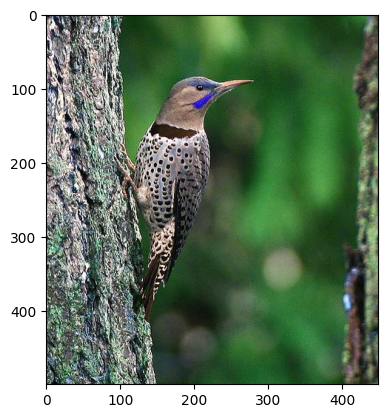

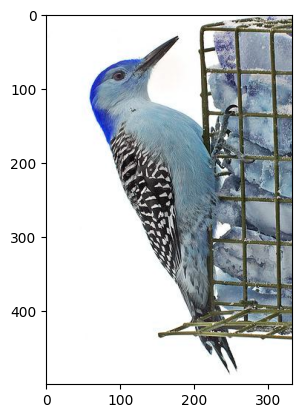

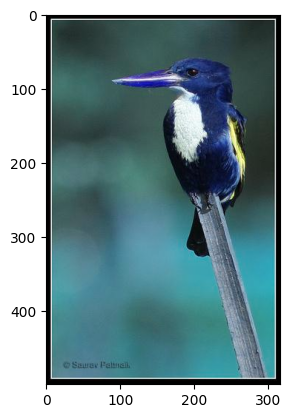

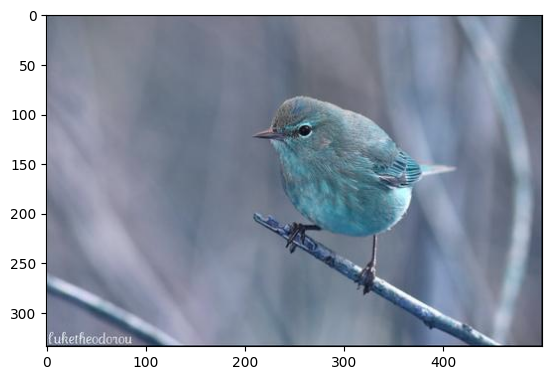

In [26]:
#visualize the sample image
for idx, image in enumerate(os.listdir(image_dir)):
    img = cv2.imread(os.path.join(image_dir, image), 1)
    plt.imshow(img)
    plt.show()
    
    if idx == 3:
        break

In [42]:
img_file_path = []
print(img_file_path)
for img in os.listdir(image_dir):
    #image  = cv2.imread(os.path.join(image_dir, img), 0)
    img_file_path.append(f'{img}')

print(img_file_path)

[]
['Northern_Flicker_0139_28419.jpeg', 'Red_Bellied_Woodpecker_0099_180766.jpeg', 'White_Breasted_Kingfisher_0062_73425.jpeg', 'Orange_Crowned_Warbler_0079_168372.jpeg', 'Pied_Kingfisher_0107_71987.jpeg', 'Field_Sparrow_0059_113759.jpeg', 'Brown_Pelican_0068_94430.jpeg', 'White_Crowned_Sparrow_0072_127080.jpeg', 'Marsh_Wren_0038_188530.jpeg', 'Magnolia_Warbler_0097_165455.jpeg', 'Cape_May_Warbler_0101_163169.jpeg', 'Cactus_Wren_0064_185826.jpeg', 'Scarlet_Tanager_0107_138577.jpeg', 'Green_Kingfisher_0062_70985.jpeg', 'White_Breasted_Kingfisher_0024_73736.jpeg', 'Western_Grebe_0099_36112.jpeg', 'Red_Eyed_Vireo_0086_157038.jpeg', 'House_Wren_0112_187355.jpeg', 'Pine_Grosbeak_0058_38431.jpeg', 'Rose_Breasted_Grosbeak_0024_39398.jpeg', 'Marsh_Wren_0008_188533.jpeg', 'Bay_Breasted_Warbler_0077_797144.jpeg', 'Clay_Colored_Sparrow_0044_110942.jpeg', 'Cardinal_0045_18021.jpeg', 'Ruby_Throated_Hummingbird_0030_57422.jpeg', 'Mourning_Warbler_0034_795384.jpeg', 'Gray_Catbird_0117_21333.jpeg', 'R

In [28]:
#img_file_path

In [43]:
import glob

In [44]:
for i in glob.glob(label_dir+'/*.xml'):
    print(i.split('/')[-1][0:-4])
    break

Least_Auklet_0045_795069


In [45]:
from sklearn.model_selection import train_test_split
train, val = train_test_split(img_file_path, test_size=0.15, random_state=101)

['Black_Billed_Cuckoo_0084_26175.jpeg', 'Red_Breasted_Merganser_0076_79312.jpeg', 'Red_Bellied_Woodpecker_0017_181131.jpeg', 'Clark_Nutcracker_0069_84767.jpeg', 'Worm_Eating_Warbler_0023_176118.jpeg', 'Black_Billed_Cuckoo_0075_795298.jpeg', 'Orange_Crowned_Warbler_0049_167974.jpeg', 'Gadwall_0001_31235.jpeg', 'Western_Meadowlark_0044_77758.jpeg', 'European_Goldfinch_0088_794651.jpeg', 'Bobolink_0092_10026.jpeg', 'Seaside_Sparrow_0046_120768.jpeg', 'Pine_Warbler_0004_171215.jpeg', 'Bronzed_Cowbird_0002_796244.jpeg', 'Red_Bellied_Woodpecker_0050_180751.jpeg', 'Blue_Winged_Warbler_0027_161795.jpeg', 'Seaside_Sparrow_0015_796500.jpeg', 'Barn_Swallow_0018_130709.jpeg', 'Red_Legged_Kittiwake_0024_795441.jpeg', 'Wilson_Warbler_0070_175169.jpeg', 'Shiny_Cowbird_0076_24363.jpeg', 'Cape_May_Warbler_0128_162971.jpeg', 'Rusty_Blackbird_0113_6664.jpeg', 'Sayornis_0020_98727.jpeg', 'Scarlet_Tanager_0055_138186.jpeg', 'Black_Footed_Albatross_0038_212.jpeg', 'Black_Throated_Blue_Warbler_0004_161404.jp

In [31]:
!pip install protobuf==3.19.3
!pip install soundfile==0.12.1
!pip install google-api-python-client==1.7.8
!pip install PyYAML==5.4
!pip install dask==2023.3.2
!pip install cupy-cuda11x==9.5.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 3.4 MB/s eta 0:00:00m eta 0:00:010:00:01
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.23.4
    Uninstalling protobuf-4.23.4:
      Successfully uninstalled protobuf-4.23.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorboard 2.15.1 requires protobuf<4.24,>=3.19.6, but you have protobuf 3.19.3 which is incompatible.
tensorflow 2.15.0.post1 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<5.0.0dev,>=3.20.3, but you have protobuf 3.19.3 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 4.9 MB/s eta 0:00:00m eta 0:00:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 kB 878.4 kB/s eta 0:00:0031m1.7 MB/s eta 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 96.9/96.9 kB 2.8 MB/s eta 0:00:00 MB/s eta 0:00:

In [21]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16094, done.
remote: Counting objects: 100% (5/5), done.
remote: Compressing objects: 100% (5/5), done.
remote: Total 16094 (delta 0), reused 4 (delta 0), pack-reused 16089
Receiving objects: 100% (16094/16094), 14.76 MiB | 1.29 MiB/s, done.
Resolving deltas: 100% (11024/11024), done.
/home/r11011101/Desktop/cv_homework/object detect/myYolo/yolov5


/home/r11011101/anaconda3/envs/yolov5/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: using dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [47]:
#os.chdir('working')
#!git clone https://github.com/ultralytics/yolov5
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/train')
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/val')
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/train/images')
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/train/labels')
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/val/images')
os.mkdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/val/labels')

In [48]:
def copy_image_file(image_items, folder_name):
    
    for image in image_items:
        img = Image.open(f'{image_dir}/{image}')
        img1 = img.resize((640, 480))
        _ = img1.save(f'{output_dir}/yolov5/data/{folder_name}/images/{image}')



In [49]:
copy_image_file(train, 'train')
copy_image_file(val, 'val')

In [50]:
df1['xmin'] = (640/df1['width']) * df1['xmin']
df1['ymin'] = (480/df1['height']) * df1['ymin']
df1['xmax'] = (640/df1['width']) * df1['xmax']
df1['ymax'] = (480/df1['height']) * df1['ymax']
df1

,name,label,width,height,xmin,ymin,xmax,ymax,class
0,Least_Auklet_0045_795069,Least Auklet,326,500,54.969325,127.680000,382.822086,394.560000,0
1,Horned_Puffin_0067_100737,Horned Puffin,457,500,229.671772,134.400000,407.527352,317.760000,1
2,Cape_Glossy_Starling_0065_129299,Cape Glossy Starling,500,310,19.200000,75.870968,469.760000,475.354839,2
3,American_Pipit_0024_99813,American Pipit,500,307,76.800000,123.517915,380.160000,348.664495,3
4,Gray_Kingbird_0037_70050,Gray Kingbird,375,500,100.693333,136.320000,387.413333,434.880000,4
...,...,...,...,...,...,...,...,...,...
5988,Caspian_Tern_0011_146058,Caspian Tern,500,333,241.920000,12.972973,542.720000,471.351351,19
5989,Green_Tailed_Towhee_0060_154820,Green Tailed Towhee,500,375,85.760000,245.760000,363.520000,384.000000,63
5990,Pied_Kingfisher_0083_72430,Pied Kingfisher,500,341,204.800000,170.322581,395.520000,332.199413,163
5991,Parakeet_Auklet_0019_795987,Parakeet Auklet,229,284,0.000000,37.183099,550.567686,478.309859,20


In [51]:
df1.replace([np.inf, -np.inf], np.nan, inplace=True)
df1.dropna(inplace=True)
df1

,name,label,width,height,xmin,ymin,xmax,ymax,class
0,Least_Auklet_0045_795069,Least Auklet,326,500,54.969325,127.680000,382.822086,394.560000,0
1,Horned_Puffin_0067_100737,Horned Puffin,457,500,229.671772,134.400000,407.527352,317.760000,1
2,Cape_Glossy_Starling_0065_129299,Cape Glossy Starling,500,310,19.200000,75.870968,469.760000,475.354839,2
3,American_Pipit_0024_99813,American Pipit,500,307,76.800000,123.517915,380.160000,348.664495,3
4,Gray_Kingbird_0037_70050,Gray Kingbird,375,500,100.693333,136.320000,387.413333,434.880000,4
...,...,...,...,...,...,...,...,...,...
5988,Caspian_Tern_0011_146058,Caspian Tern,500,333,241.920000,12.972973,542.720000,471.351351,19
5989,Green_Tailed_Towhee_0060_154820,Green Tailed Towhee,500,375,85.760000,245.760000,363.520000,384.000000,63
5990,Pied_Kingfisher_0083_72430,Pied Kingfisher,500,341,204.800000,170.322581,395.520000,332.199413,163
5991,Parakeet_Auklet_0019_795987,Parakeet Auklet,229,284,0.000000,37.183099,550.567686,478.309859,20


In [52]:
df1[['xmin', 'ymin', 'xmax', 'ymax']] = df1[['xmin', 'ymin', 'xmax', 'ymax']].astype('int')

In [53]:
WIDTH = 640
HEIGHT = 480

In [54]:
df1['x_center'] = (df1['xmin']+df1['xmax'])/(2*WIDTH)
df1['y_center'] = (df1['ymin']+df1['ymax'])/(2*HEIGHT)
df1['box_width'] = (df1['xmax']-df1['xmin'])/ WIDTH
df1['box_height'] = (df1['ymax']-df1['ymin'])/ HEIGHT

In [55]:
df1 = df1.astype(str)

In [56]:
def copy_label(label_items, folder_name):
    file_name = [x.split('.')[0] for x in img_file_path]
    for name in file_name:
        data = df1[df1.name == name]
        #print(data)
        box_list = []
        for idx in range(len(data)):
            row = data.iloc[idx]
            box_list.append(row['class']+" "+row['x_center']+" "+row['y_center']+" "+ row['box_width']+" "+row['box_height'])

        text = "\n".join(box_list)
        #print(text)
        with open(f'{output_dir}/yolov5/data/{folder_name}/labels/{name}.txt', 'w') as file:
            file.write(text)

In [57]:
copy_label(train, 'train')
copy_label(val, 'val')

                             name             label width height xmin ymin  \
4911  Northern_Flicker_0139_28419  Northern Flicker   449    500  125   76   

     xmax ymax class x_center             y_center box_width box_height  
4911  411  400   167  0.41875  0.49583333333333335  0.446875      0.675  
                                    name                   label width height  \
3234  Red_Bellied_Woodpecker_0099_180766  Red Bellied Woodpecker   333    500   

     xmin ymin xmax ymax class   x_center            y_center box_width  \
3234  113   22  501  469    50  0.4796875  0.5114583333333333   0.60625   

     box_height  
3234    0.93125  
                                      name                      label width  \
4764  White_Breasted_Kingfisher_0062_73425  White Breasted Kingfisher   317   

     height xmin ymin xmax ymax class   x_center            y_center  \
4764    500  175   54  555  316   173  0.5703125  0.3854166666666667   

     box_width          box_height  
4764

輸出所有label名稱讓下面的ymal file 可以用

In [33]:
#print(df1[['name']].unique())

#df1['name'].unique()

unique_names = df1['label'].unique()
print(len(df1['label'].unique()))

'''
for name in unique_names:
    #print("'" + name + "', ", end='')
'''
# 或者直接將結果以字串形式印出
result_string = "', '".join(unique_names)
print(result_string)


200
Least Auklet', 'Horned Puffin', 'Cape Glossy Starling', 'American Pipit', 'Gray Kingbird', 'Pigeon Guillemot', 'Eared Grebe', 'Cerulean Warbler', 'American Redstart', 'Shiny Cowbird', 'Heermann Gull', 'Herring Gull', 'American Goldfinch', 'Nighthawk', 'Evening Grosbeak', 'Green Jay', 'Red Winged Blackbird', 'Henslow Sparrow', 'Cactus Wren', 'Caspian Tern', 'Parakeet Auklet', 'Brandt Cormorant', 'Yellow Warbler', 'Groove Billed Ani', 'Black Throated Blue Warbler', 'Tree Sparrow', 'Western Grebe', 'Bobolink', 'Clark Nutcracker', 'White Throated Sparrow', 'Brewer Blackbird', 'California Gull', 'Least Flycatcher', 'Dark Eyed Junco', 'Gray Catbird', 'Bohemian Waxwing', 'Ivory Gull', 'Indigo Bunting', 'Pileated Woodpecker', 'Whip Poor Will', 'Western Wood Pewee', 'Rock Wren', 'Rusty Blackbird', 'House Sparrow', 'Forsters Tern', 'Prairie Warbler', 'Tree Swallow', 'Green Violetear', 'Chuck Will Widow', 'Harris Sparrow', 'Red Bellied Woodpecker', 'Scott Oriole', 'Cape May Warbler', 'Blue He

In [58]:
yaml_text = """train: /home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/train/images
val: /home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/val/images

nc: 200
names: ['Pelagic Cormorant', 'Nashville Warbler', 'Cape May Warbler', 'White Breasted Nuthatch', 'Sage Thrasher', 'Bobolink', 'White Pelican', 'Orange Crowned Warbler', 'Rose Breasted Grosbeak', 'Sayornis', 'Gray Crowned Rosy Finch', 'Pomarine Jaeger', 'Horned Lark', 'Bank Swallow', 'Brewer Blackbird', 'Painted Bunting', 'Henslow Sparrow', 'Crested Auklet', 'Golden Winged Warbler', 'American Crow', 'Green Violetear', 'Brown Thrasher', 'Kentucky Warbler', 'Tree Sparrow', 'White Necked Raven', 'Pigeon Guillemot', 'Hooded Merganser', 'White Throated Sparrow', 'Cactus Wren', 'Ringed Kingfisher', 'Tropical Kingbird', 'Glaucous Winged Gull', 'Louisiana Waterthrush', 'Prairie Warbler', 'Fish Crow', 'Cliff Swallow', 'Forsters Tern', 'Bewick Wren', 'Ivory Gull', 'Gadwall', 'Mangrove Cuckoo', 'Pied Kingfisher', 'Le Conte Sparrow', 'Loggerhead Shrike', 'Swainson Warbler', 'Vermilion Flycatcher', 'Baird Sparrow', 'Pied Billed Grebe', 'Red Faced Cormorant', 'Orchard Oriole', 'Blue Grosbeak', 'Wilson Warbler', 'Black And White Warbler', 'Tree Swallow', 'Yellow Warbler', 'Least Flycatcher', 'California Gull', 'Mockingbird', 'Northern Fulmar', 'Green Jay', 'Black Capped Vireo', 'Chuck Will Widow', 'Red Breasted Merganser', 'Summer Tanager', 'House Sparrow', 'Yellow Billed Cuckoo', 'Common Raven', 'Black Billed Cuckoo', 'Mourning Warbler', 'Pine Grosbeak', 'European Goldfinch', 'Black Throated Blue Warbler', 'Clark Nutcracker', 'Field Sparrow', 'Least Tern', 'Hooded Warbler', 'American Goldfinch', 'Magnolia Warbler', 'Prothonotary Warbler', 'Yellow Bellied Flycatcher', 'Green Tailed Towhee', 'Warbling Vireo', 'Harris Sparrow', 'Rock Wren', 'Blue Headed Vireo', 'Downy Woodpecker', 'Olive Sided Flycatcher', 'Northern Flicker', 'Rusty Blackbird', 'Savannah Sparrow', 'Winter Wren', 'Black Throated Sparrow', 'Acadian Flycatcher', 'Brown Pelican', 'Blue Jay', 'Groove Billed Ani', 'Long Tailed Jaeger', 'Horned Grebe', 'American Pipit', 'Vesper Sparrow', 'Red Eyed Vireo', 'Shiny Cowbird', 'Indigo Bunting', 'Frigatebird', 'Black Footed Albatross', 'Least Auklet', 'Red Legged Kittiwake', 'Seaside Sparrow', 'Blue Winged Warbler', 'Northern Waterthrush', 'Dark Eyed Junco', 'Myrtle Warbler', 'Bohemian Waxwing', 'Carolina Wren', 'American Three Toed Woodpecker', 'Rufous Hummingbird', 'Heermann Gull', 'Great Crested Flycatcher', 'Nighthawk', 'Whip Poor Will', 'Baltimore Oriole', 'Mallard', 'Bay Breasted Warbler', 'Belted Kingfisher', 'White Breasted Kingfisher', 'Fox Sparrow', 'Tennessee Warbler', 'Grasshopper Sparrow', 'Caspian Tern', 'Sooty Albatross', 'Song Sparrow', 'Common Yellowthroat', 'Yellow Headed Blackbird', 'Scarlet Tanager', 'Ovenbird', 'Scott Oriole', 'Evening Grosbeak', 'Philadelphia Vireo', 'Eared Grebe', 'White Crowned Sparrow', 'Geococcyx', 'Eastern Towhee', 'Ring Billed Gull', 'Clay Colored Sparrow', 'Spotted Catbird', 'White Eyed Vireo', 'Marsh Wren', 'Yellow Throated Vireo', 'Lazuli Bunting', 'Canada Warbler', 'Cerulean Warbler', 'Pacific Loon', 'Laysan Albatross', 'Black Tern', 'Slaty Backed Gull', 'Cardinal', 'Hooded Oriole', 'Lincoln Sparrow', 'Brandt Cormorant', 'Artic Tern', 'Cedar Waxwing', 'Purple Finch', 'Palm Warbler', 'Western Meadowlark', 'Red Winged Blackbird', 'Rhinoceros Auklet', 'Green Kingfisher', 'Scissor Tailed Flycatcher', 'Chestnut Sided Warbler', 'Gray Catbird', 'Cape Glossy Starling', 'Ruby Throated Hummingbird', 'Brewer Sparrow', 'Florida Jay', 'Bronzed Cowbird', 'Great Grey Shrike', 'Gray Kingbird', 'Pine Warbler', 'Chipping Sparrow', 'Barn Swallow', 'Western Grebe', 'Boat Tailed Grackle', 'Common Tern', 'Western Gull', 'Parakeet Auklet', 'American Redstart', 'House Wren', 'Red Cockaded Woodpecker', 'Pileated Woodpecker', 'Elegant Tern', 'Red Bellied Woodpecker', 'Nelson Sharp Tailed Sparrow', 'Brown Creeper', 'Herring Gull', 'Western Wood Pewee', 'Anna Hummingbird', 'Yellow Breasted Chat', 'Worm Eating Warbler', 'Red Headed Woodpecker', 'Horned Puffin']"""

with open("/home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/data.yaml", 'w') as file:
    file.write(yaml_text)

%cat /home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/data.yaml

cat: /home/r11011101/Desktop/cv_homework/object: No such file or directory
cat: detect/myYolo/working/yolov5/data/data.yaml: No such file or directory


In [59]:
!ls -al /home/r11011101/Desktop/cv_homework/object detect/myYolo/working/yolov5/data/train/labels

ls: cannot access '/home/r11011101/Desktop/cv_homework/object': No such file or directory
ls: cannot access 'detect/myYolo/working/yolov5/data/train/labels': No such file or directory


In [60]:
os.chdir('/home/r11011101/Desktop/cv_homework/object detect/myYolo/')

In [61]:
!pwd

/home/r11011101/Desktop/cv_homework/object detect/myYolo


In [62]:
!python working/yolov5/train.py --img 640 --epochs 100 --batch 32 --data working/yolov5/data/data.yaml --cfg working/yolov5/models/yolov5s.yaml --weights yolov5s.pt --name bird_detection_yolov5

2023-12-16 15:08:29.273100: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-16 15:08:29.273127: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-16 15:08:29.273664: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=working/yolov5/models/yolov5s.yaml, data=working/yolov5/data/data.yaml, hyp=working/yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=32, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, si

In [63]:
from IPython.display import Image as Display

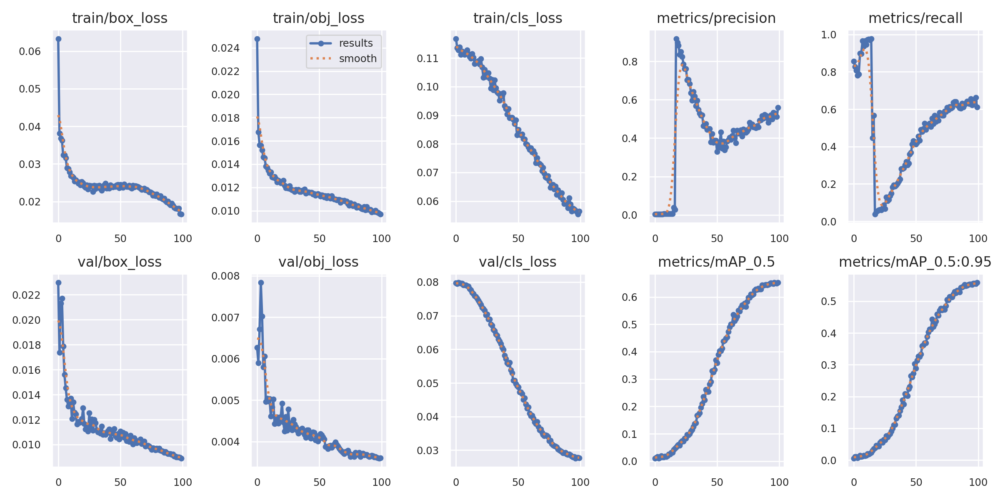

In [64]:
Display(filename='working/yolov5/runs/train/bird_detection_yolov53/results.png', width=1080)

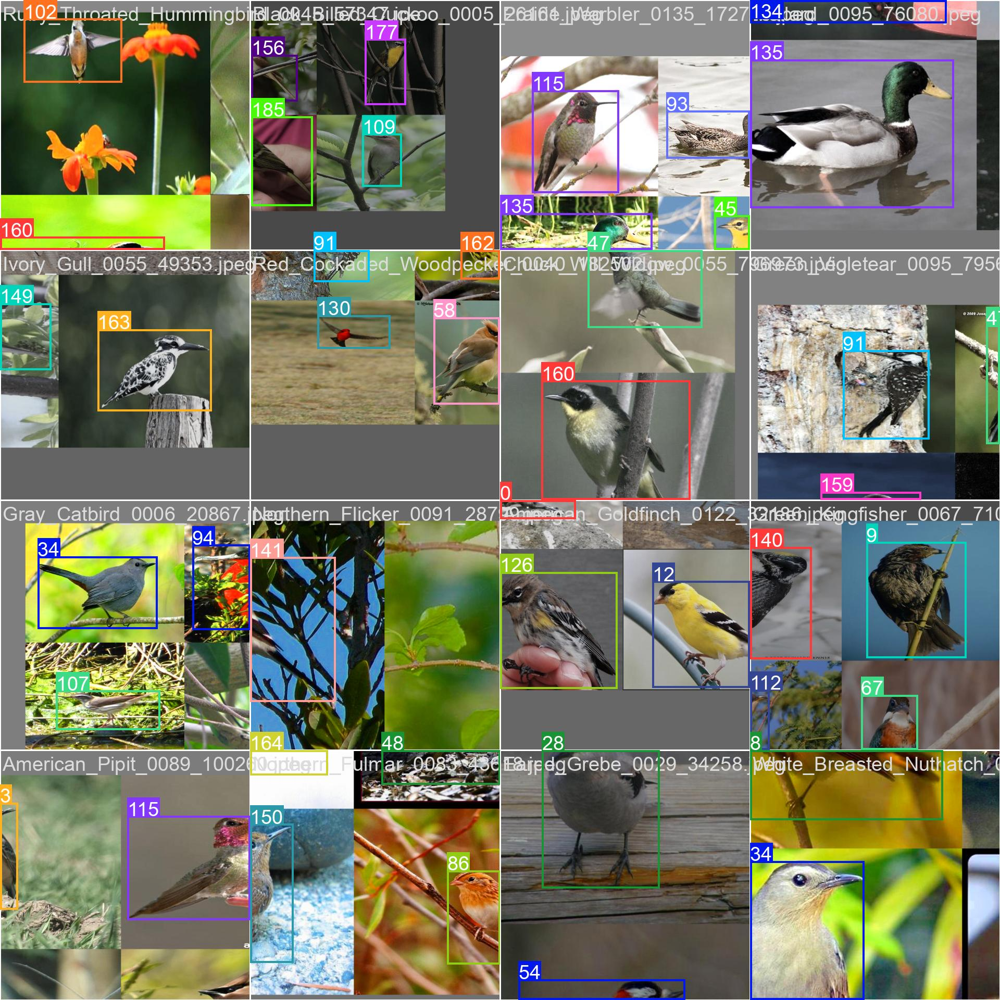

In [65]:
Display(filename='working/yolov5/runs/train/bird_detection_yolov53/train_batch0.jpg', width=1000)

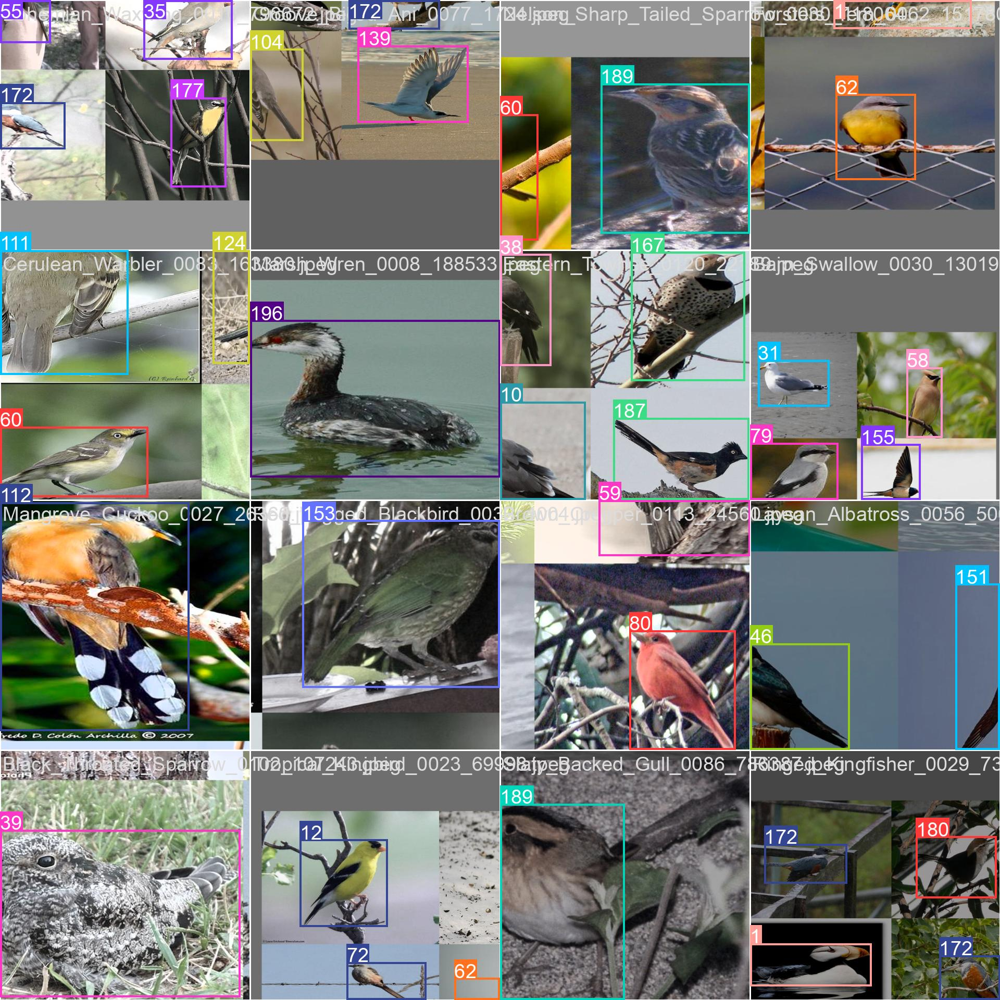

In [67]:
Display(filename='working/yolov5/runs/train/bird_detection_yolov53/train_batch1.jpg', width=1000)

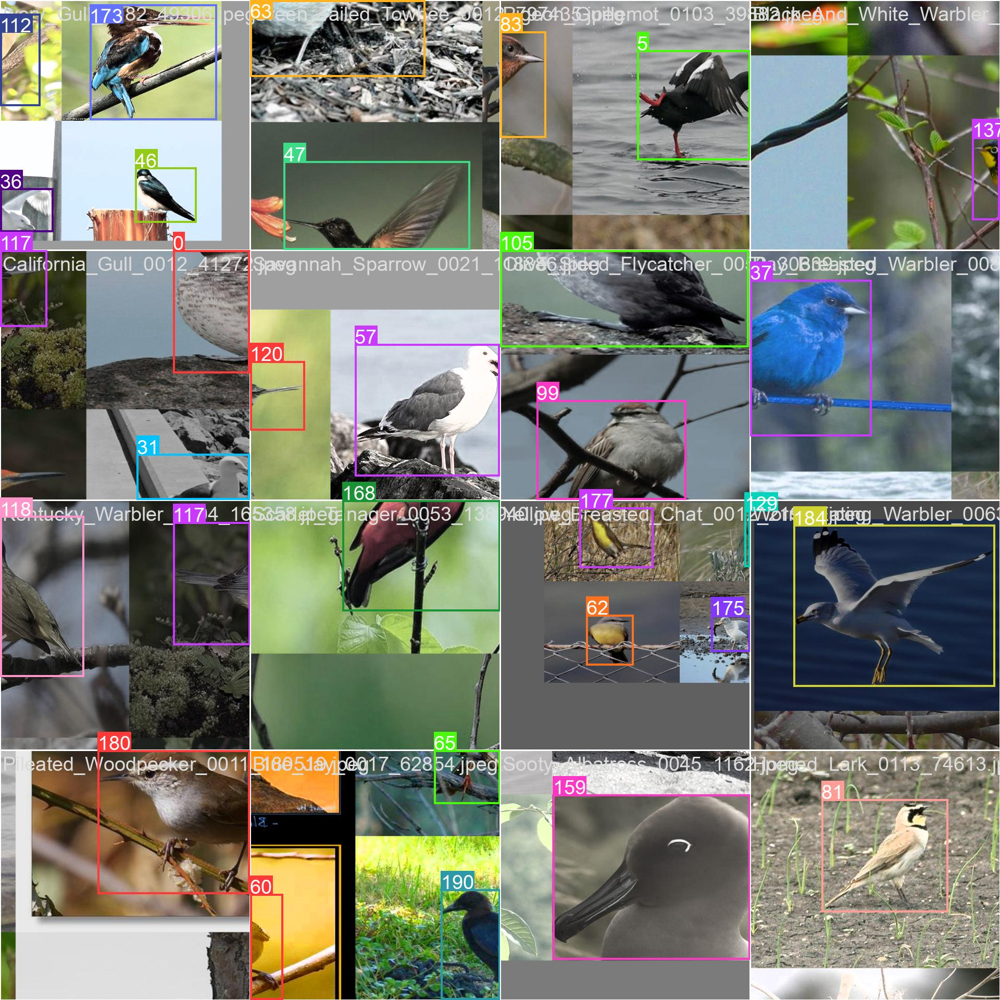

In [68]:
Display(filename='working/yolov5/runs/train/bird_detection_yolov53/train_batch2.jpg', width=1000)

In [61]:
!ls working/yolov5

CITATION.cff	 __pycache__	export.py	  segment	  val.py
CONTRIBUTING.md  benchmarks.py	hubconf.py	  setup.cfg
LICENSE		 classify	models		  train.py
README.md	 data		requirements.txt  tutorial.ipynb
README.zh-CN.md  detect.py	runs		  utils


In [69]:
!python working/yolov5/detect.py --weights working/yolov5/runs/train/bird_detection_yolov53/weights/best.pt --source for_one_test

detect: weights=['working/yolov5/runs/train/bird_detection_yolov53/weights/best.pt'], source=for_one_test, data=working/yolov5/data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=working/yolov5/runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
fatal: cannot change to '/home/r11011101/Desktop/cv_homework/object': No such file or directory
YOLOv5 🚀 2023-12-14 Python-3.10.13 torch-2.1.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3090, 24238MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7549525 parameters, 0 gradients, 17.5 GFLOPs
image 1/61 /home/r11011101/Desktop/cv_homework/object detect/myYolo/for_one_test/American_Crow_0036_25313.jpg: 512x640 1 Rhinoceros Auklet, 1 Red Bellied Woodpecker, 3

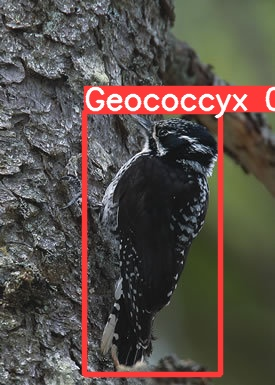

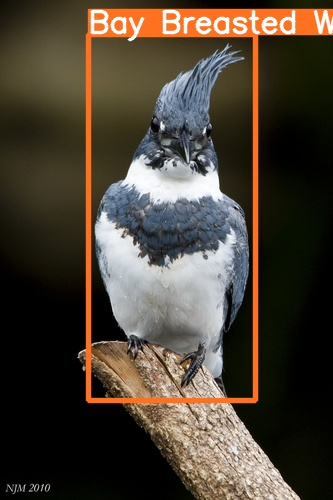

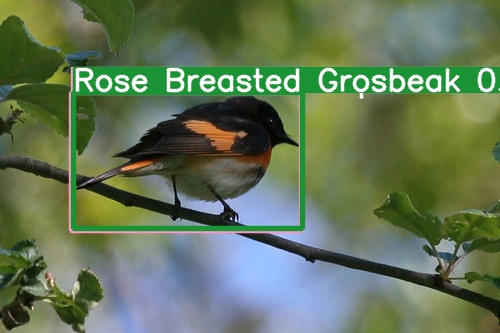

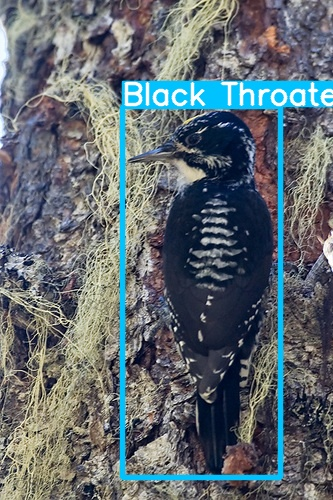

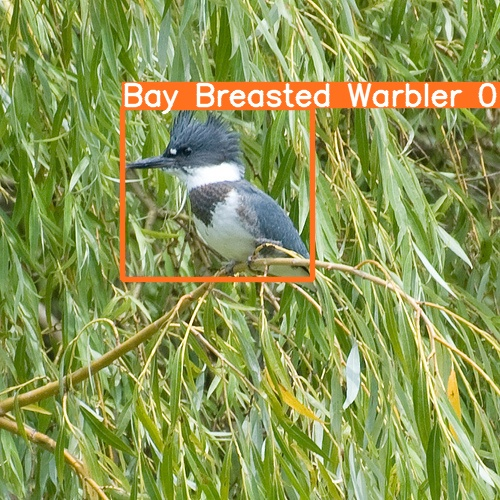

...

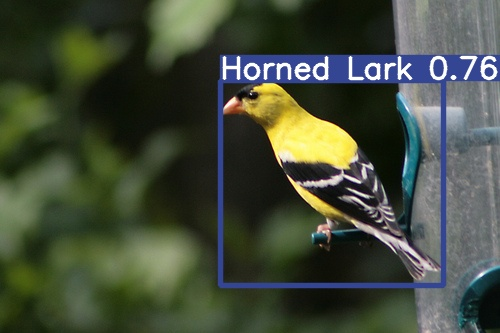

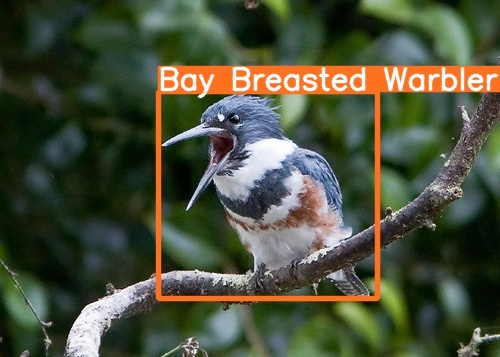

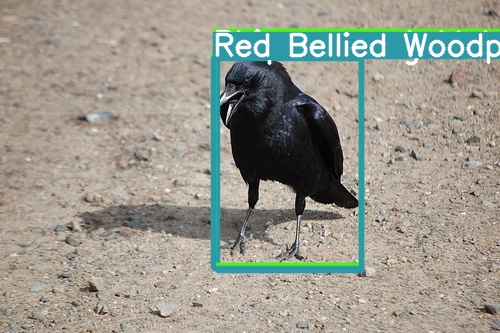

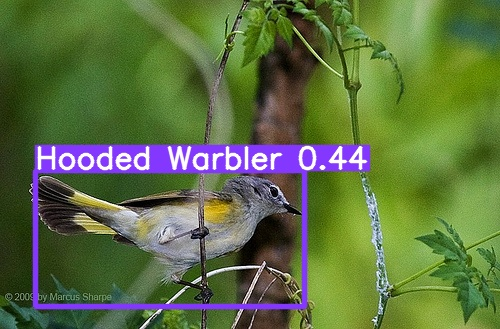

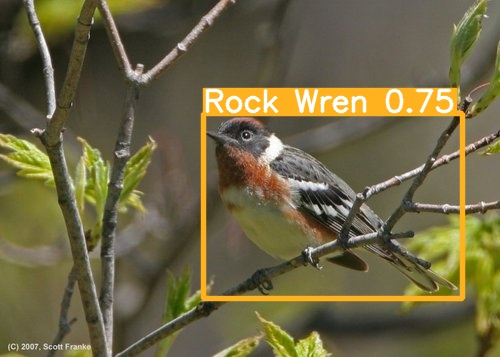

In [72]:
from IPython.display import display, Image as IPImage
import os
def display_images_in_directory(directory):
    # 获取目录中所有文件
    files = os.listdir(directory)

    # 筛选出图片文件
    image_files = [file for file in files if file.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp'))]

    if not image_files:
        print("在目录中未找到任何图片文件。")
        return

    # 显示每个图片
    for image_file in image_files:
        image_path = os.path.join(directory, image_file)
        display(IPImage(filename=image_path))

if __name__ == "__main__":
    # 指定目录路径
    directory_path = "working/yolov5/runs/detect/exp2"

    # 显示目录下的所有图片
    display_images_in_directory(directory_path)